# Integration of WT (Set 2) and bcd-RNAi

In [1]:
#load packages
library(Seurat)
library(ggplot2)
library(magrittr)
library(data.table)
library(Matrix)
library(dplyr)
library(tibble)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [2]:
#load datasets
seu.set2 <- readRDS(file = '../../data/seurat_object/Set2/seu_HQC_subclusterd2_Set2.obj')
seu.set2
seu.bcd <- readRDS(file = '../../data/seurat_object/bcdRNAi/seu_HQC_subclustered2_bcdRNAi.obj')
seu.bcd

An object of class Seurat 
28355 features across 4855 samples within 2 assays 
Active assay: SCT (10851 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, reumap

An object of class Seurat 
28533 features across 6168 samples within 2 assays 
Active assay: SCT (11029 features, 3000 variable features)
 1 other assay present: RNA
 4 dimensional reductions calculated: pca, umap, tsne, reumap

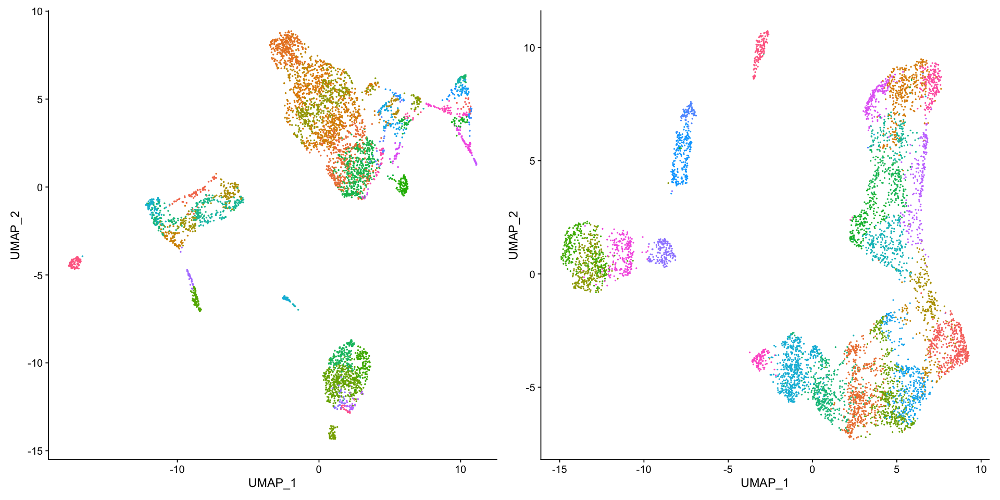

In [3]:
options(repr.plot.width=16, repr.plot.height=8)
p1 <- DimPlot(seu.set2, reduction = 'umap') + NoLegend() 
p2 <- DimPlot(seu.bcd, reduction = 'umap') + NoLegend() 
plot(p1+p2)

## Preprocessing

In [4]:
#Add dataset info into object
seu.set2$genotype <- 'set_2'
seu.bcd$genotype <- 'bcd_RNAi'

In [5]:
#Normalize each dataset independently
NormalizeFunc <- function(seu){
    DefaultAssay(seu) <- 'RNA'
    seu <- suppressWarnings(SCTransform(seu, vars.to.regress = c('percent.rRNA','percent.mt')))
    return(seu)
}
seu.bcd <- NormalizeFunc(seu.bcd)
seu.set2 <- NormalizeFunc(seu.set2)

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 11029 by 6168

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 6168 cells



  |======================================================================| 100%


Found 148 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 11029 genes



  |======================================================================| 100%


Computing corrected count matrix for 11029 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 1.284616 mins

Determine variable features

Set 3000 variable features

Place corrected count matrix in counts slot

Regressing out percent.rRNA, percent.mt

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 10851 by 4855

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 4855 cells



  |======================================================================| 100%


Found 146 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 10851 genes



  |======================================================================| 100%


Computing corrected count matrix for 10851 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 50.89691 secs

Determine variable features

Set 3000 variable features

Place corrected count matrix in counts slot

Regressing out percent.rRNA, percent.mt

Centering data matrix

Set default assay to SCT



## Merge datasets

In [6]:
# Without batch correction
obj.list <- list(seu.set2,seu.bcd)
names(obj.list) <- c('set_2','bcd_RNAi')
integration.features <- SelectIntegrationFeatures(object.list = obj.list, nfeatures = 3000)
seu.merge <- merge(seu.set2, seu.bcd, add.cell.ids = c('Set2','bcdRNAi'))
seu.merge

An object of class Seurat 
28966 features across 11023 samples within 2 assays 
Active assay: SCT (11462 features, 0 variable features)
 1 other assay present: RNA

## Dimensionality reduction and Clustering

In [7]:
VariableFeatures(seu.merge) <- integration.features
seu.merge <- RunPCA(seu.merge)
seu.merge <- RunUMAP(seu.merge, dims = 1:30, n.neighbors = 20L)
seu.merge <- FindNeighbors(seu.merge, dims = 1:30)
seu.merge <- FindClusters(seu.merge)

PC_ 1 
Positive:  SoxN, ImpL2, mirr, cv-2, Brd, E(spl)mgamma-HLH, E(spl)m4-BFM, CG45263, E(spl)malpha-BFM, tup 
	   ths, toc, blot, CG10035, sog, E(spl)m7-HLH, CG15628, aop, CG13427, vn 
	   Lac, Tet, peb, Atx-1, CG34224, Tom, E(spl)m5-HLH, ASPP, Dl, Svil 
Negative:  Ilp4, zfh1, twi, CadN, hll, sna, Mef2, sprt, CG12177, Mes2 
	   Cyp310a1, htl, Act87E, tin, VepD, NetA, stumps, CG16758, Mdr49, CG1673 
	   CG14688, CG3036, CG11357, Nplp2, lncRNA:CR45361, CG43658, Myc, shep, ltl, CG43355-sala 
PC_ 2 
Positive:  SoxN, sog, Ilp4, ImpL2, ths, sca, CadN, twi, Toll-6, stg 
	   trn, hll, sna, D, zfh1, CG43355-sala, E(spl)mgamma-HLH, Tet, slp1, hth 
	   sprt, Mef2, Tollo, wntD, NetA, CG12177, Dl, tkv, Meltrin, Cyp310a1 
Negative:  peb, dap, tup, mirr, Doc1, cv-2, egr, CG45263, pgc, Doc3 
	   stai, Ance, Eno, srp, nos, wisp, Tao, bru1, CycB, fabp-sea 
	   p23, BigH1, Hsp27, sas, ovo, Hsp83, 26-29-p, shu, del, Alk 
PC_ 3 
Positive:  mirr, peb, tup, CG45263, Ance, egr, cv-2, Svil, Dtg, Alk 
	   Ama

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 11023
Number of edges: 384120

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8793
Number of communities: 17
Elapsed time: 1 seconds


In [8]:
seu.merge

An object of class Seurat 
28966 features across 11023 samples within 2 assays 
Active assay: SCT (11462 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

Warning message:
“Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session.”


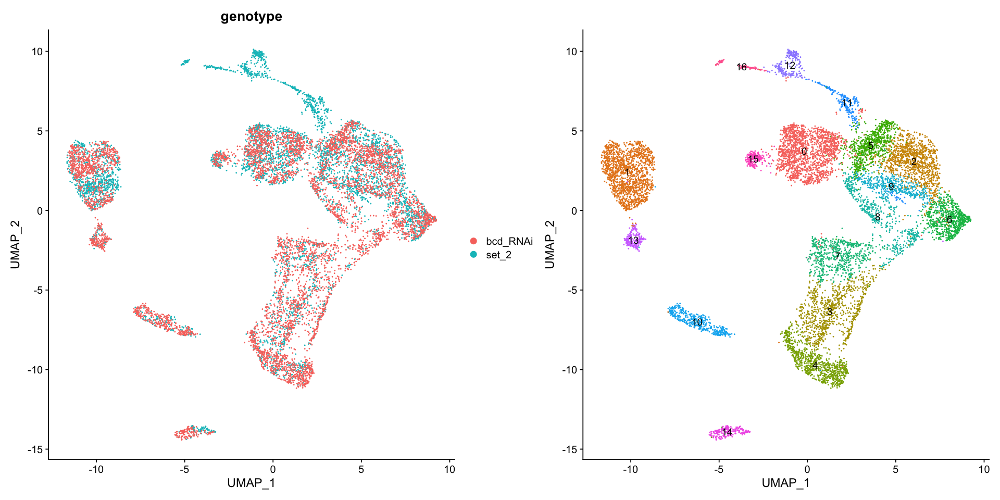

In [9]:
options(repr.plot.width=16, repr.plot.height=8)
p1 <- DimPlot(seu.merge, reduction = 'umap', group.by = 'genotype') 
p2 <- DimPlot(seu.merge, reduction = 'umap', label = T) + NoLegend()
plot(p1+p2)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 11023
Number of edges: 384120

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8630
Number of communities: 18
Elapsed time: 1 seconds


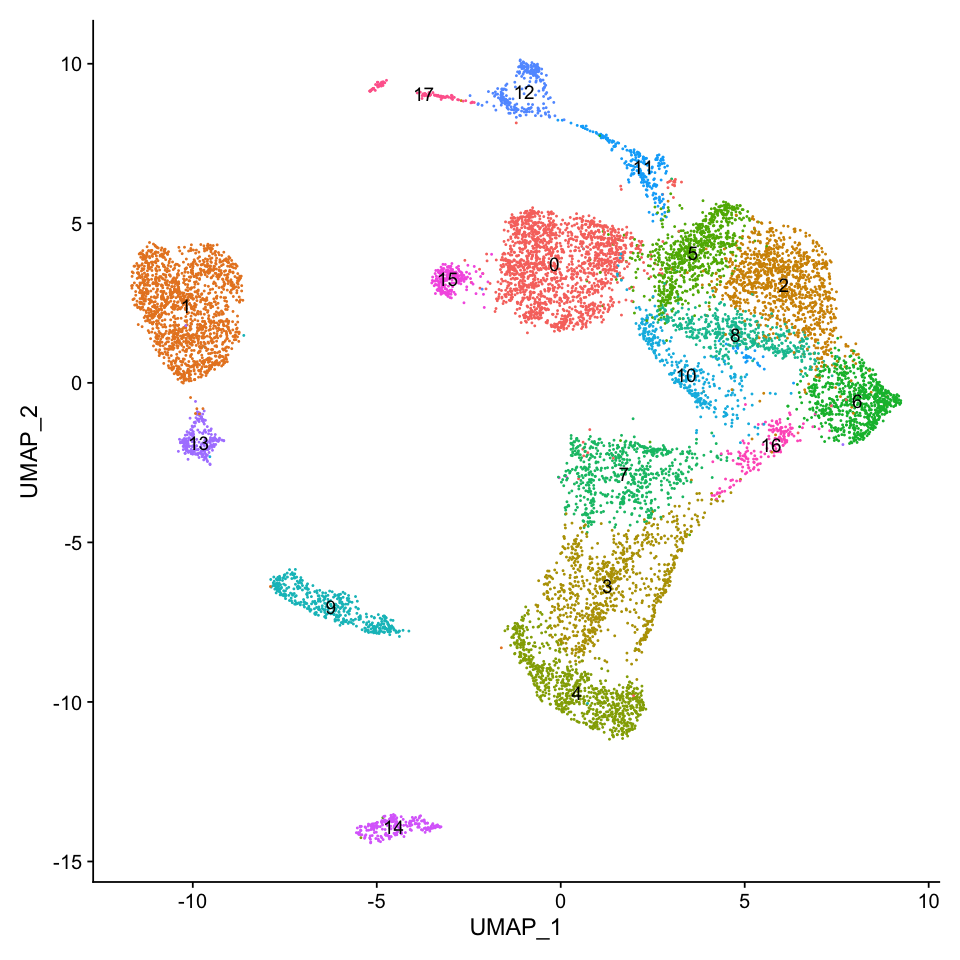

In [10]:
options(repr.plot.width=8, repr.plot.height=8)
seu.merge <- FindClusters(seu.merge, resolution = 1.0)
p <- DimPlot(seu.merge, reduction = 'umap', label = T) + NoLegend()
plot(p)

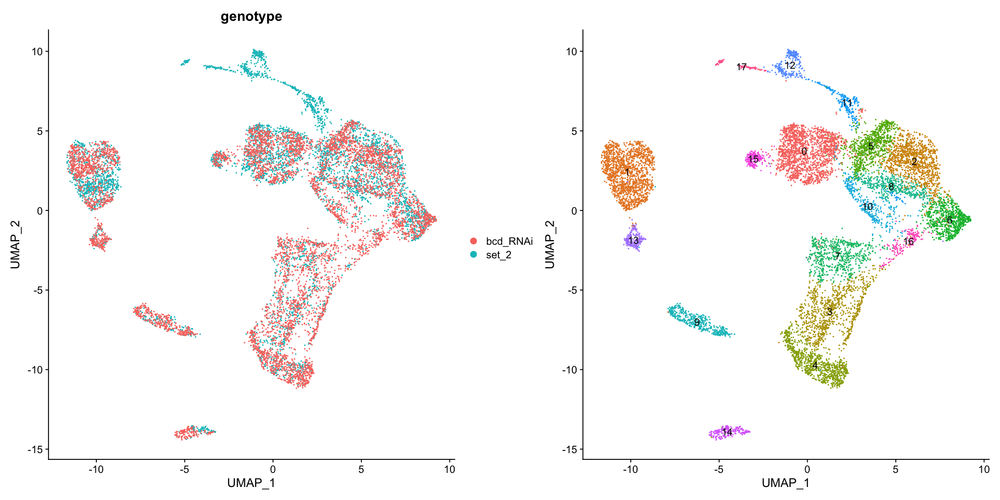

In [11]:
options(repr.plot.width=16, repr.plot.height=8)
p1 <- DimPlot(seu.merge, reduction = 'umap', group.by = 'genotype') 
p2 <- DimPlot(seu.merge, reduction = 'umap', label = T) + NoLegend()
plot(p1+p2)

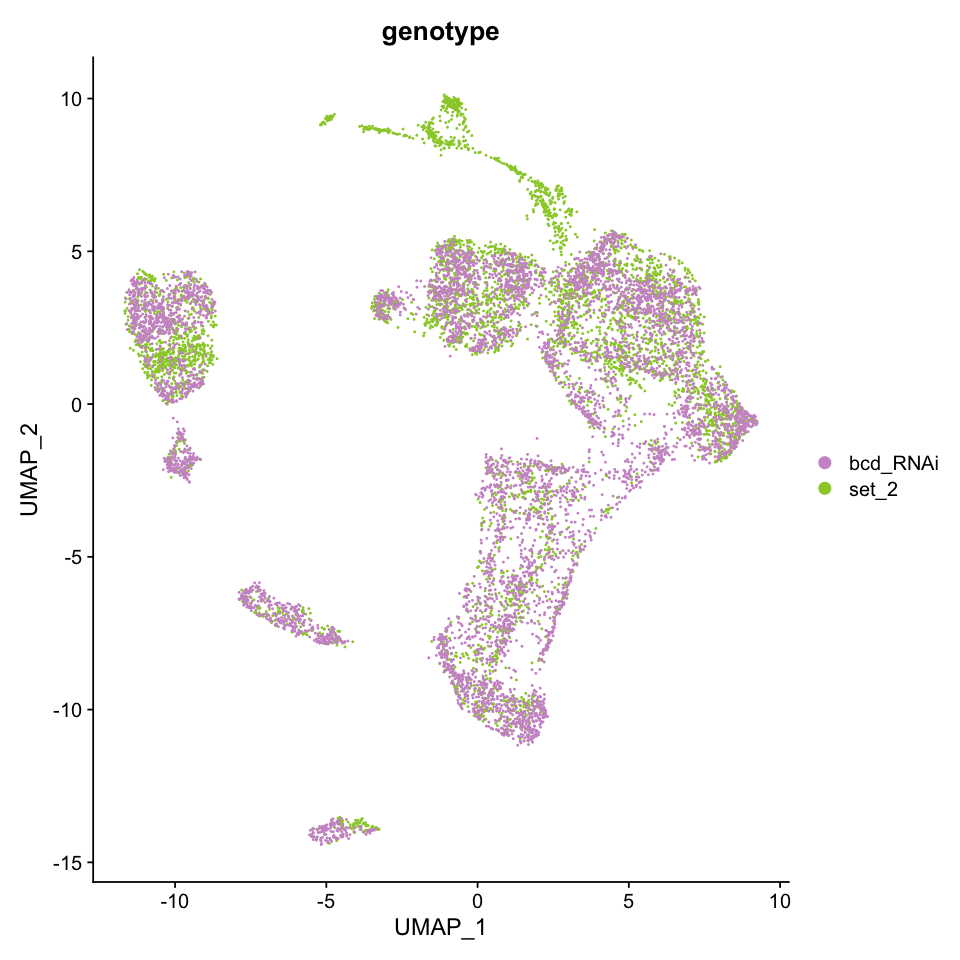

In [12]:
Idents(seu.merge) <- 'genotype'
levels(seu.merge) <- c('set_2','bcd_RNAi')
options(repr.plot.width=8, repr.plot.height=8)
p1 <- DimPlot(seu.merge, reduction = 'umap', group.by = 'genotype', cols = c("plum3", "olivedrab3")) 
p1
ggsave(p1, file = "./figures/1_integrate_bcdRNAi_NaiveIngegration/Naive_results_All_Set.eps", dpi = 300, width = 8, height =8)

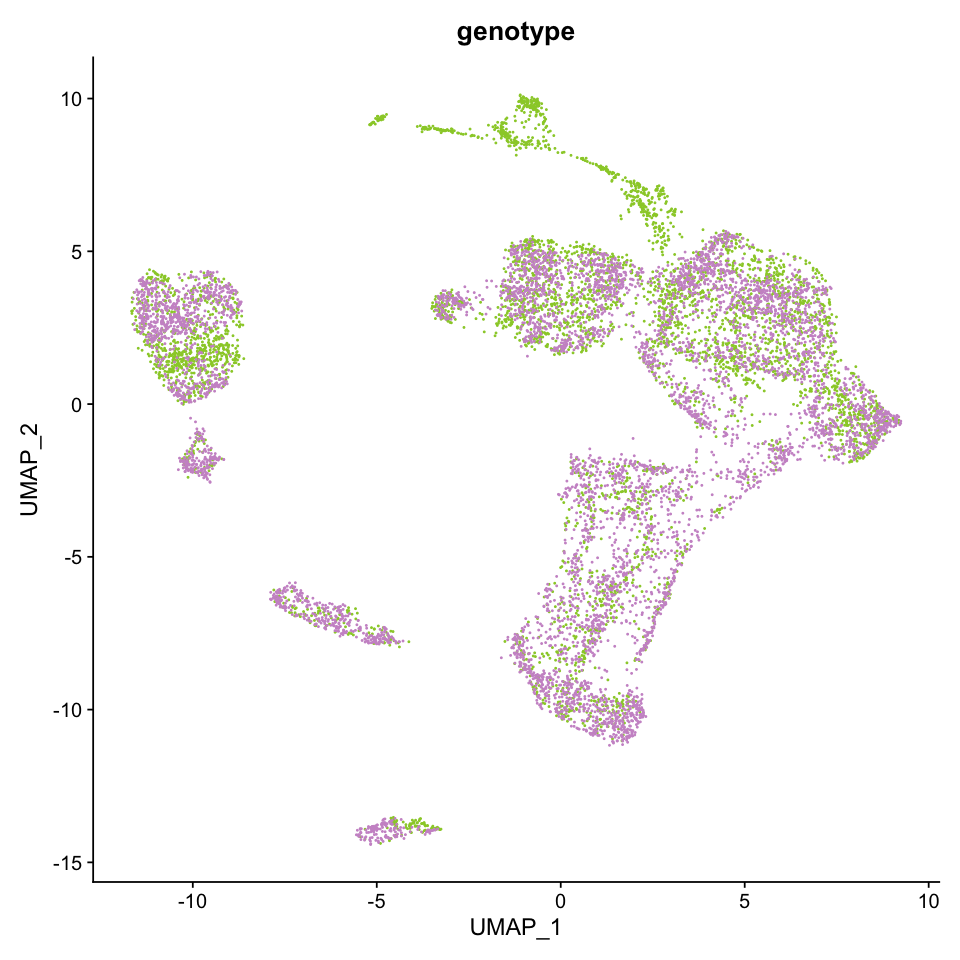

In [13]:
options(repr.plot.width=8, repr.plot.height=8)
p1 <- DimPlot(seu.merge, reduction = 'umap', group.by = 'genotype', cols = c("plum3", "olivedrab3")) + NoLegend()
p1
ggsave(p1, file = "./figures/1_integrate_bcdRNAi_NaiveIngegration/Naive_results_All_Set_wo_legend.eps", dpi = 300, width = 8, height =8)

In [14]:
Idents(seu.merge) <- 'seurat_clusters'
all.markers <- FindAllMarkers(object = seu.merge, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17



[1] 3967

[1] 180

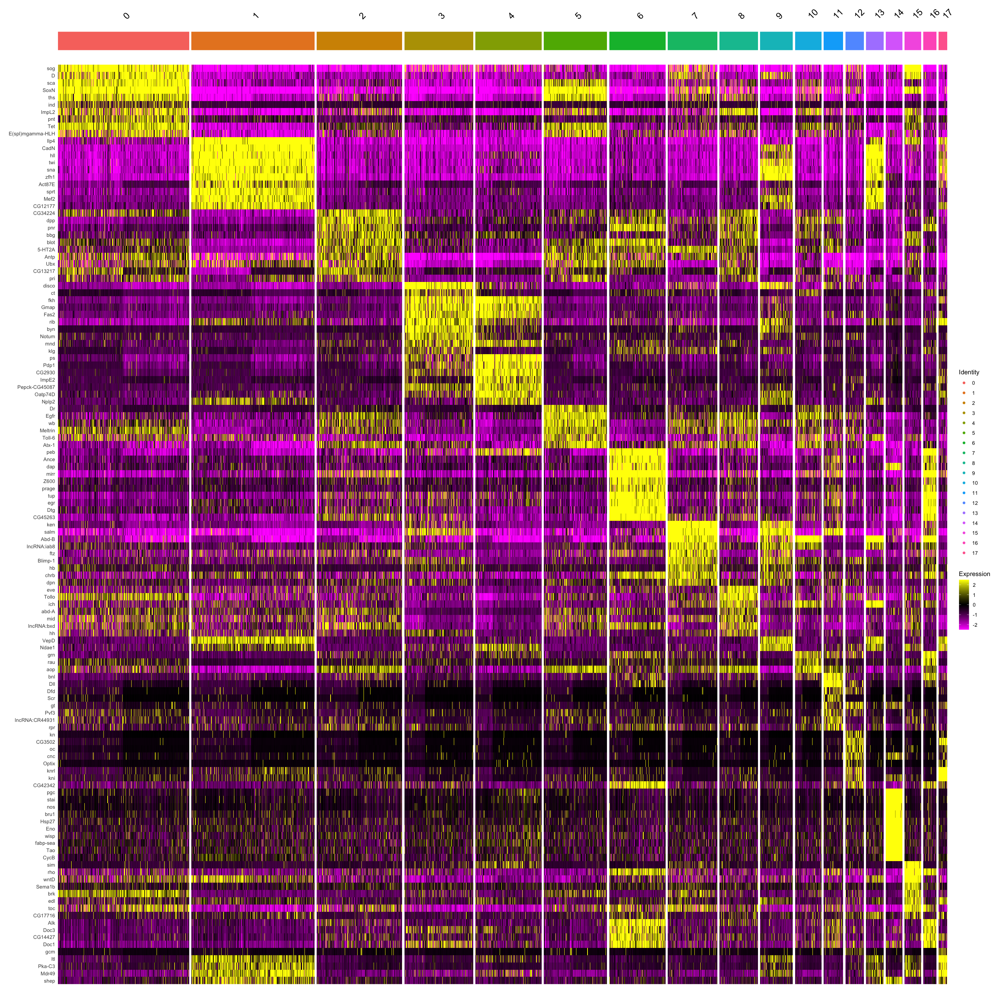

In [15]:
options(repr.plot.width=24, repr.plot.height=24)
DoHeatmap(seu.merge, features = c(all.markers.top10$gene))

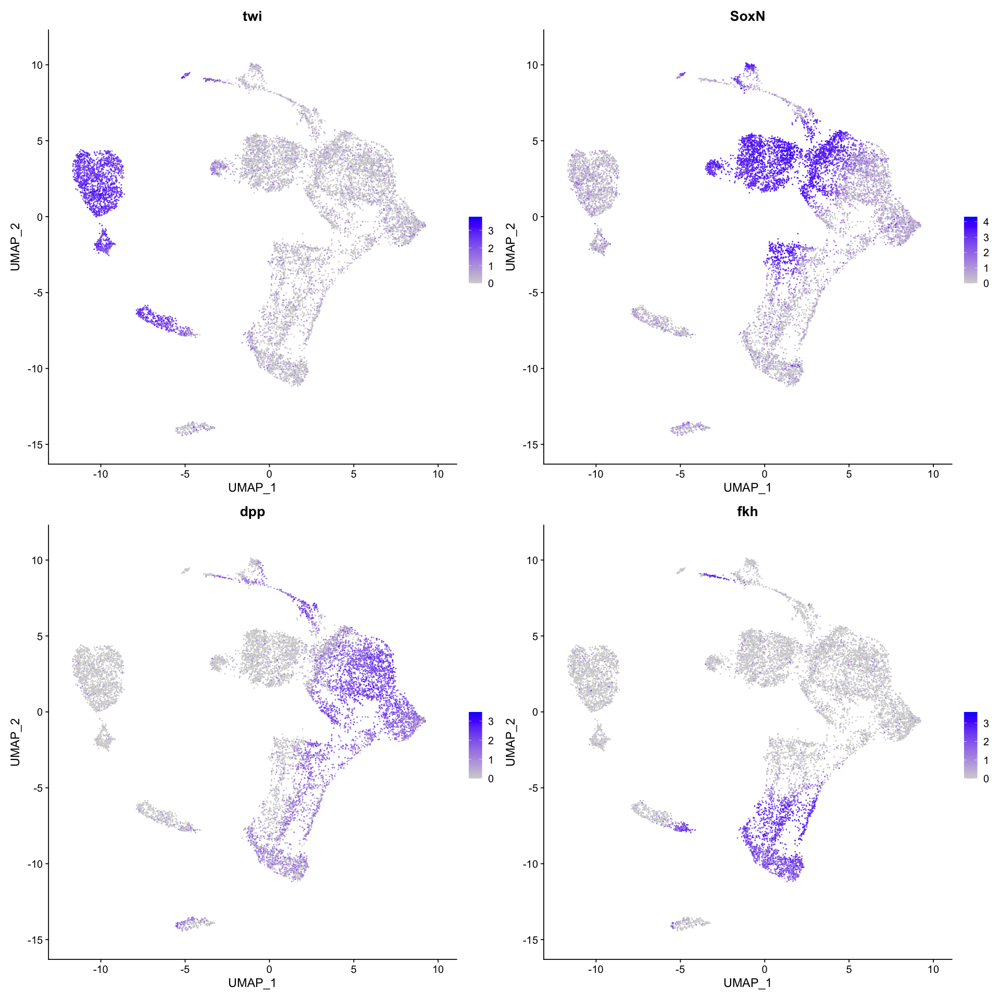

In [16]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu.merge, features = c('twi','SoxN','dpp','fkh'), reduction = 'umap')

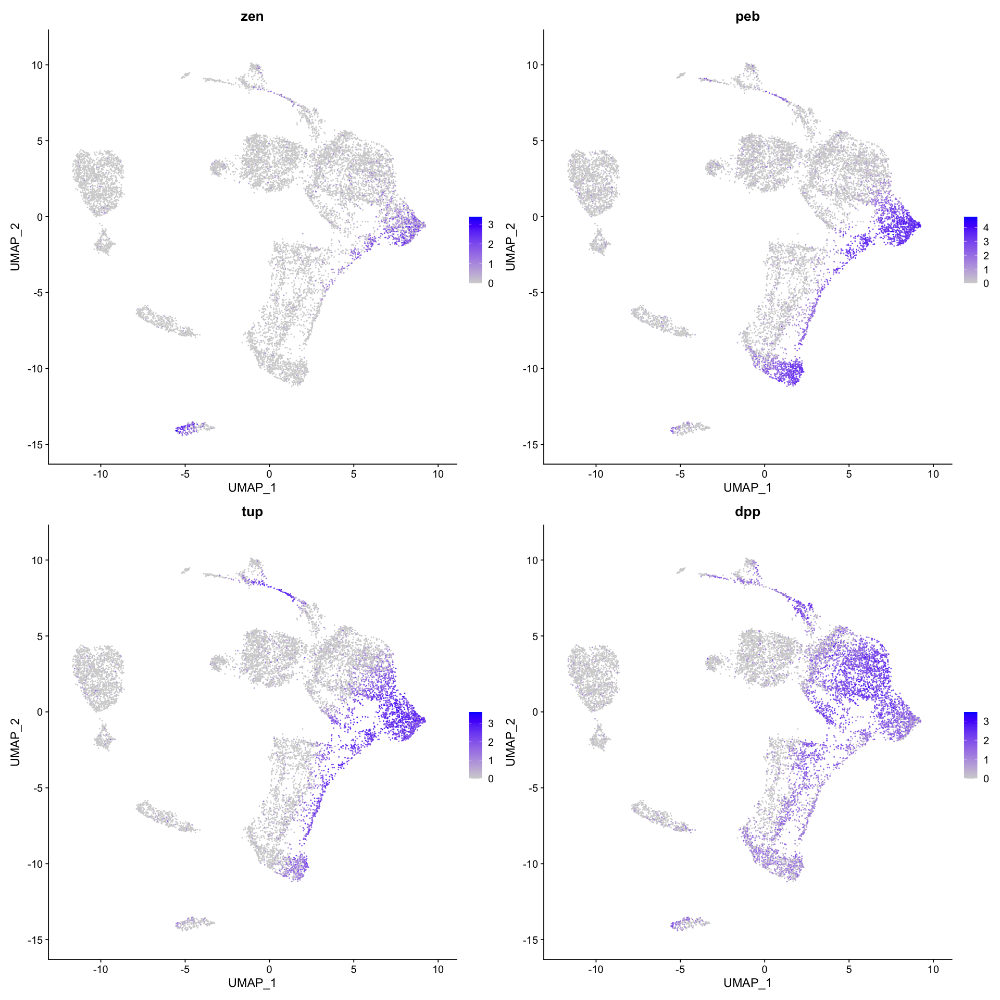

In [17]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu.merge, features = c('zen','peb','tup','dpp'), reduction = 'umap')

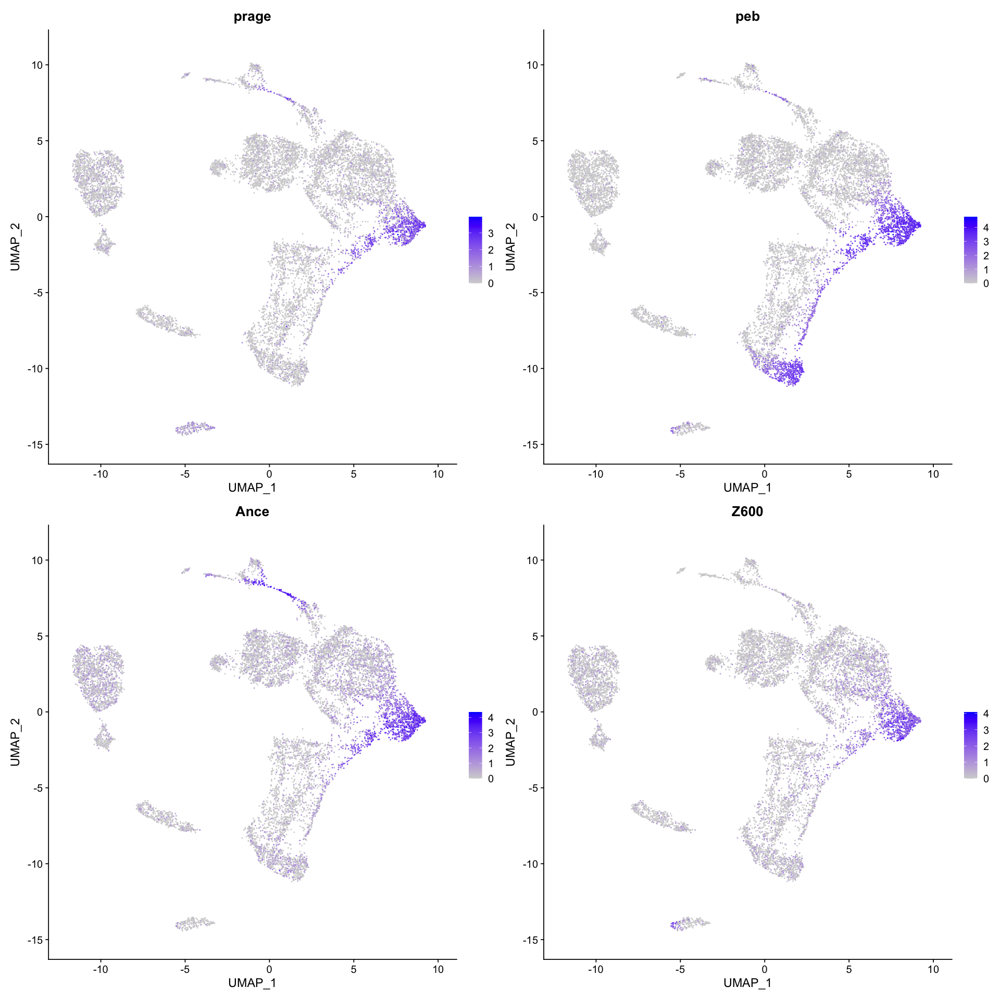

In [18]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu.merge, features = c('prage','peb','Ance','Z600'), reduction = 'umap')

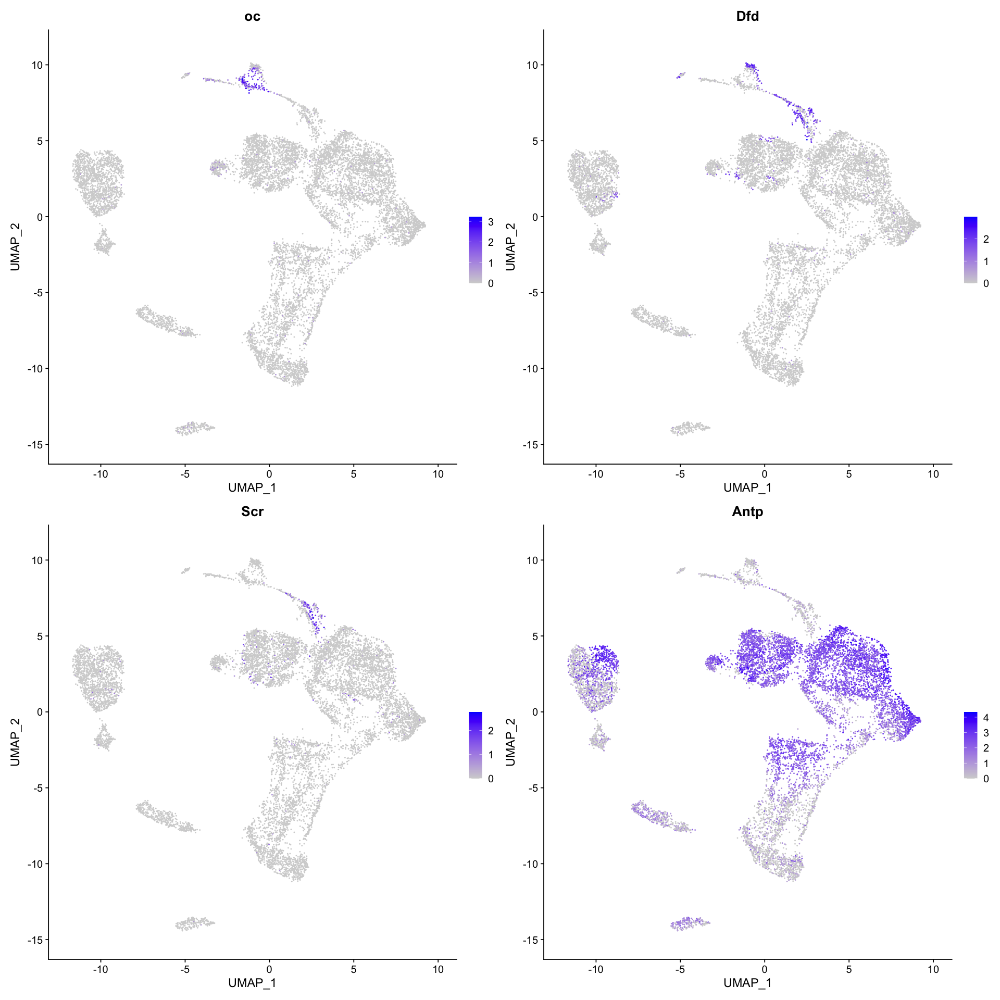

In [19]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu.merge, features = c('oc','Dfd','Scr','Antp'), reduction = 'umap')

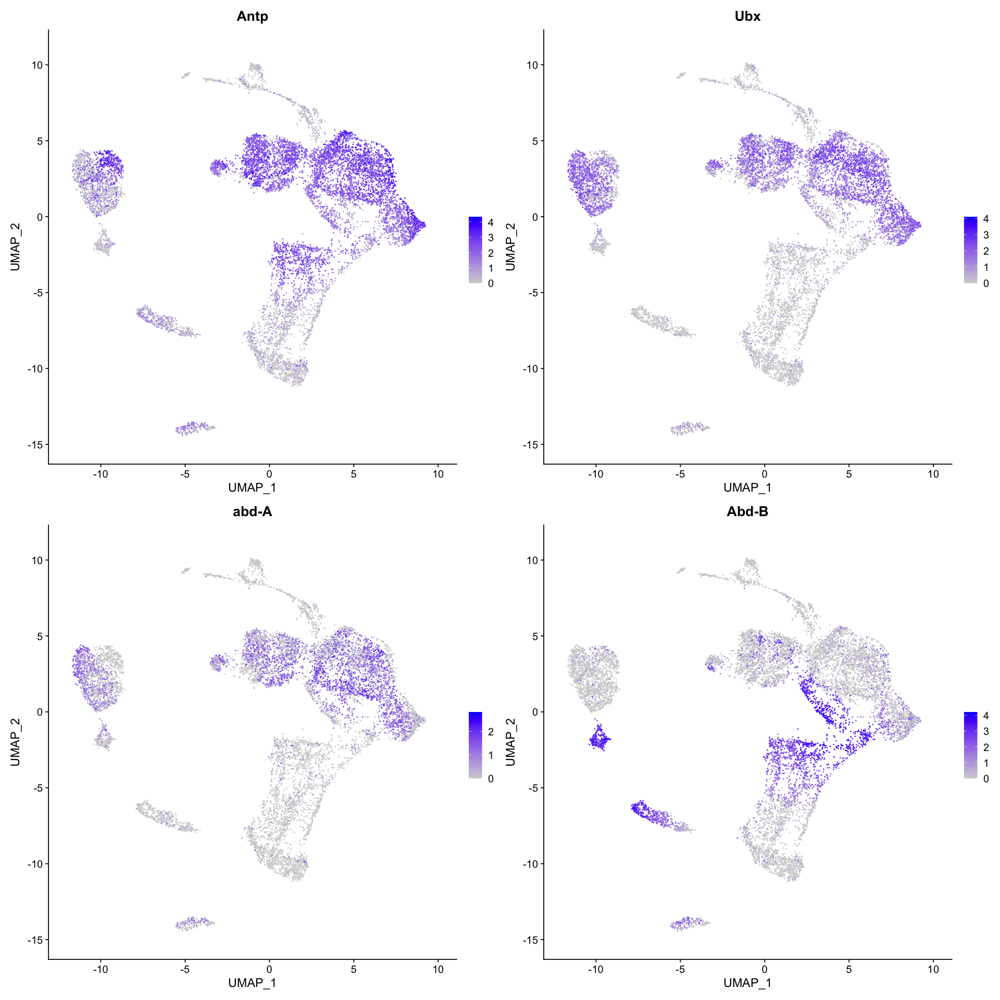

In [20]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu.merge, features = c('Antp','Ubx','abd-A','Abd-B'), reduction = 'umap')

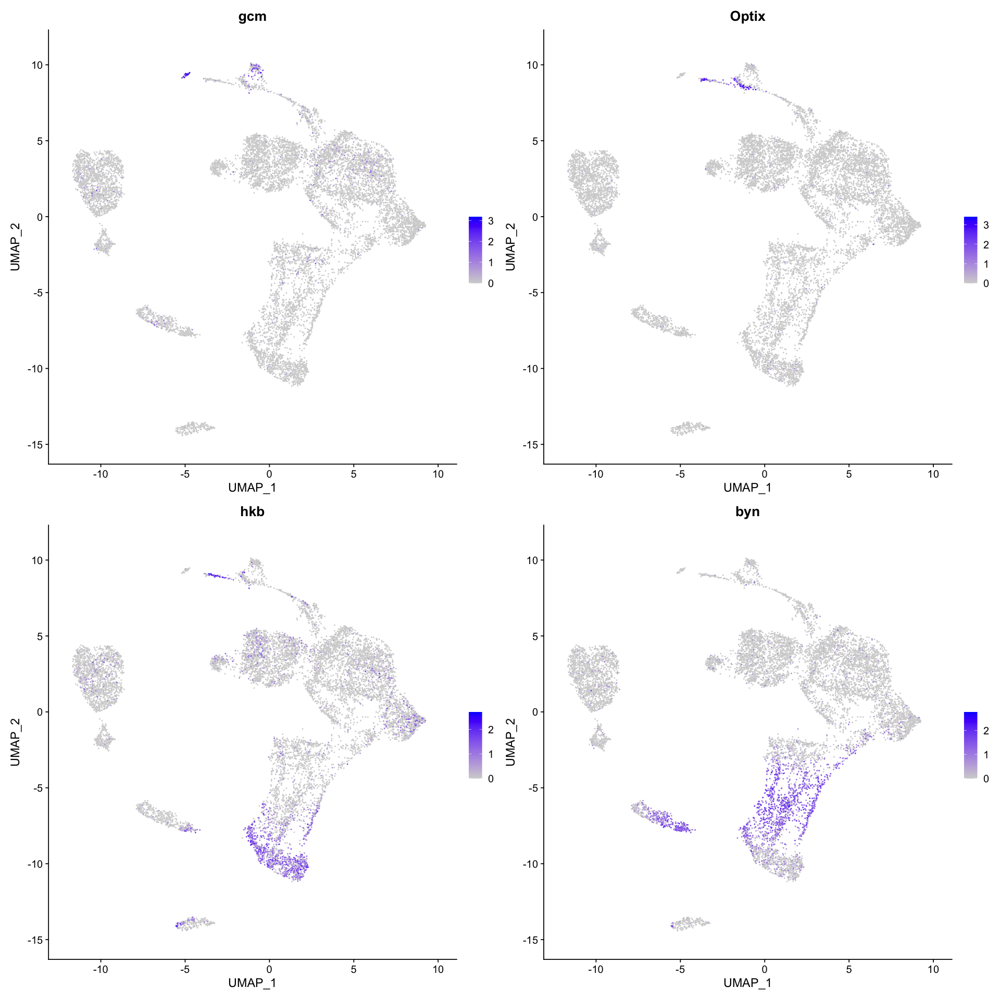

In [21]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu.merge, features = c('gcm','Optix','hkb','byn'), reduction = 'umap')

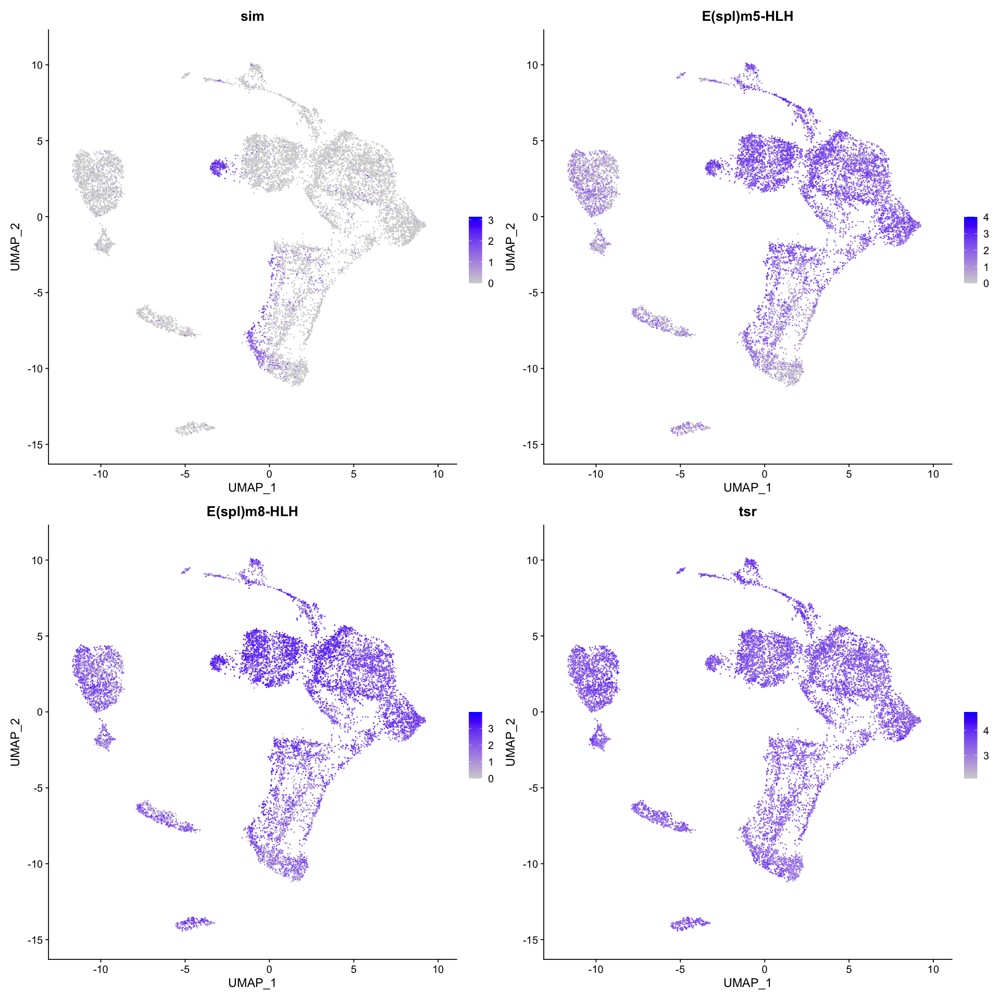

In [22]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu.merge, features = c('sim','E(spl)m5-HLH','E(spl)m8-HLH','tsr'), reduction = 'umap')

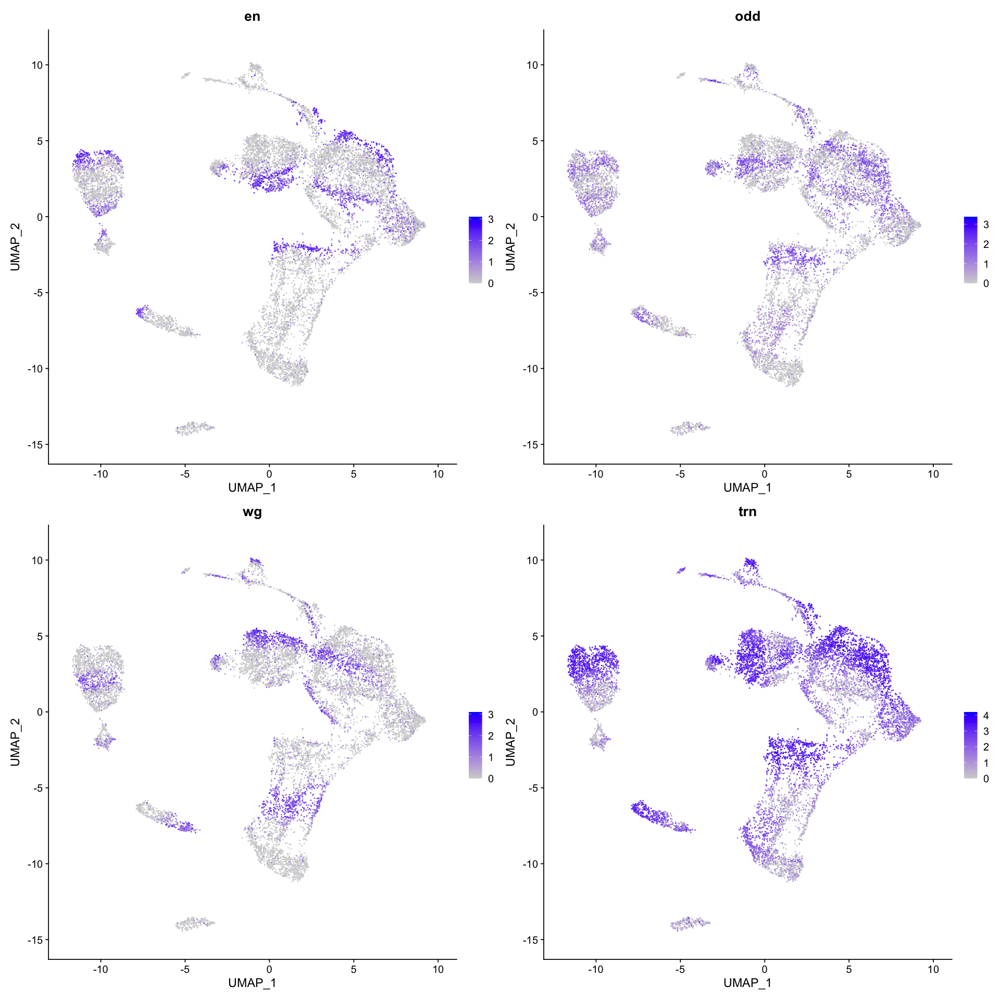

In [23]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu.merge, features = c('en','odd','wg','trn'), reduction = 'umap')

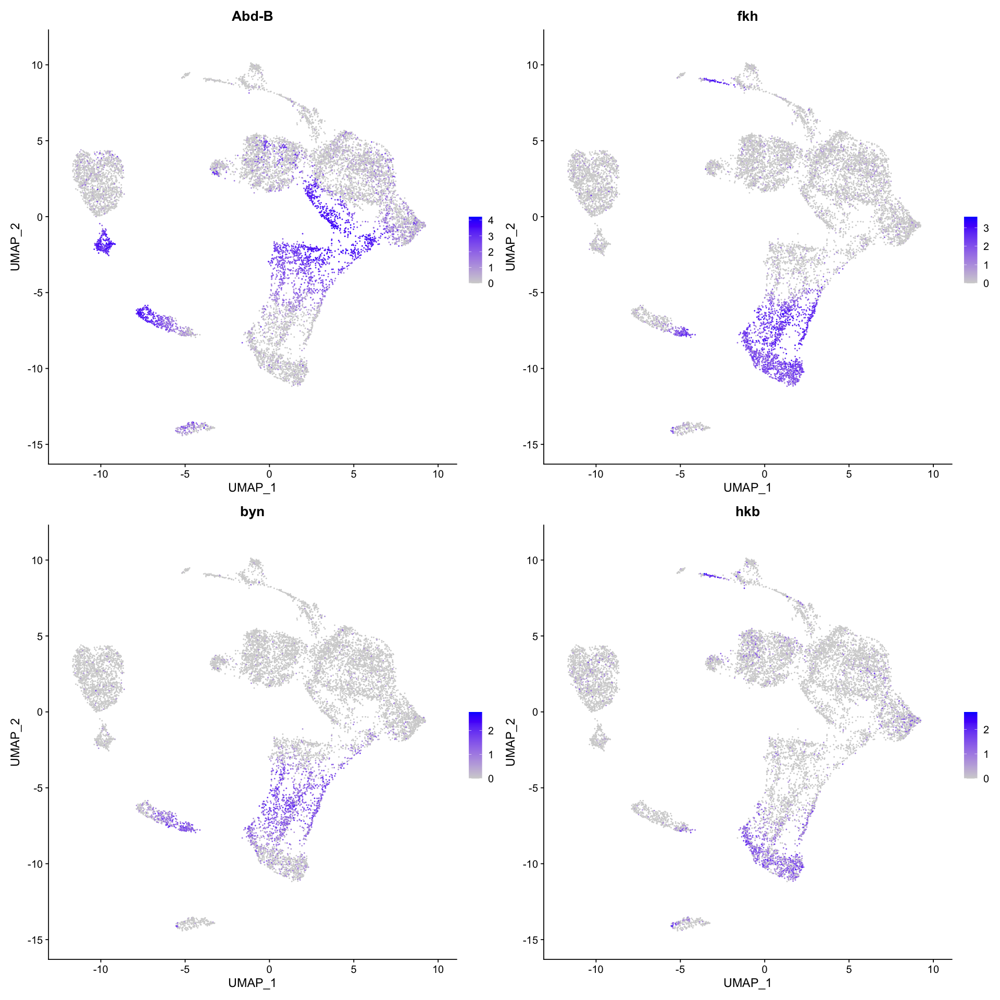

In [24]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu.merge, features = c('Abd-B','fkh','byn','hkb'), reduction = 'umap')

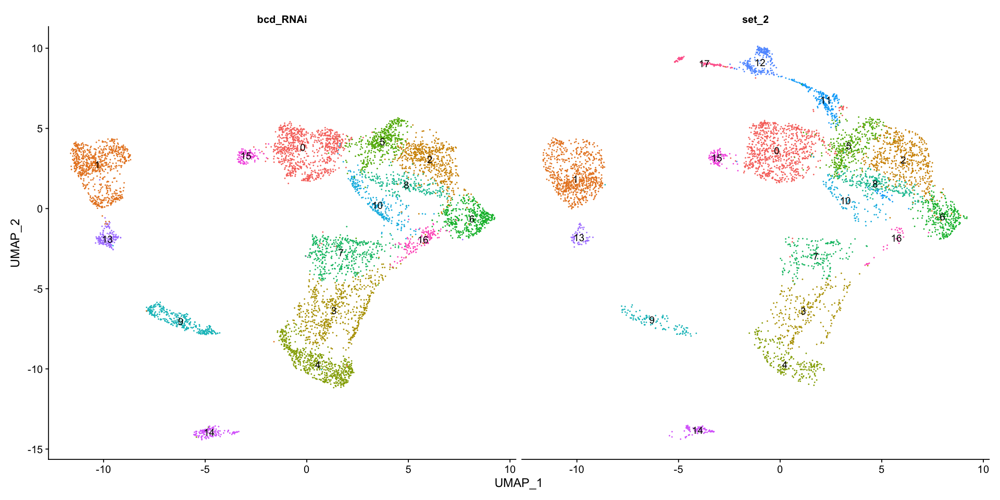

In [25]:
options(repr.plot.width=16, repr.plot.height=8)
p <- DimPlot(seu.merge, reduction = 'umap', label = T, split.by = 'genotype') + NoLegend()
plot(p)

## Cluster annotation

,manual_ID
,<fct>
Set2_AAACCCACAAGTGATA,0
Set2_AAACCCACACTTGGCG,3
Set2_AAACCCATCCGTGTCT,0
Set2_AAACGAAAGAATCGTA,6
Set2_AAACGAAAGACTTCCA,6
Set2_AAACGAATCAAGCCTA,8


,manual_ID
,<fct>
Set2_AAACCCACAAGTGATA,Trunk_medial_neuroectoderm
Set2_AAACCCACACTTGGCG,Hindgut
Set2_AAACCCATCCGTGTCT,Trunk_medial_neuroectoderm
Set2_AAACGAAAGAATCGTA,Trunk_amnioserosa
Set2_AAACGAAAGACTTCCA,Trunk_amnioserosa
Set2_AAACGAATCAAGCCTA,Trunk_dorsal_ectoderm_odd


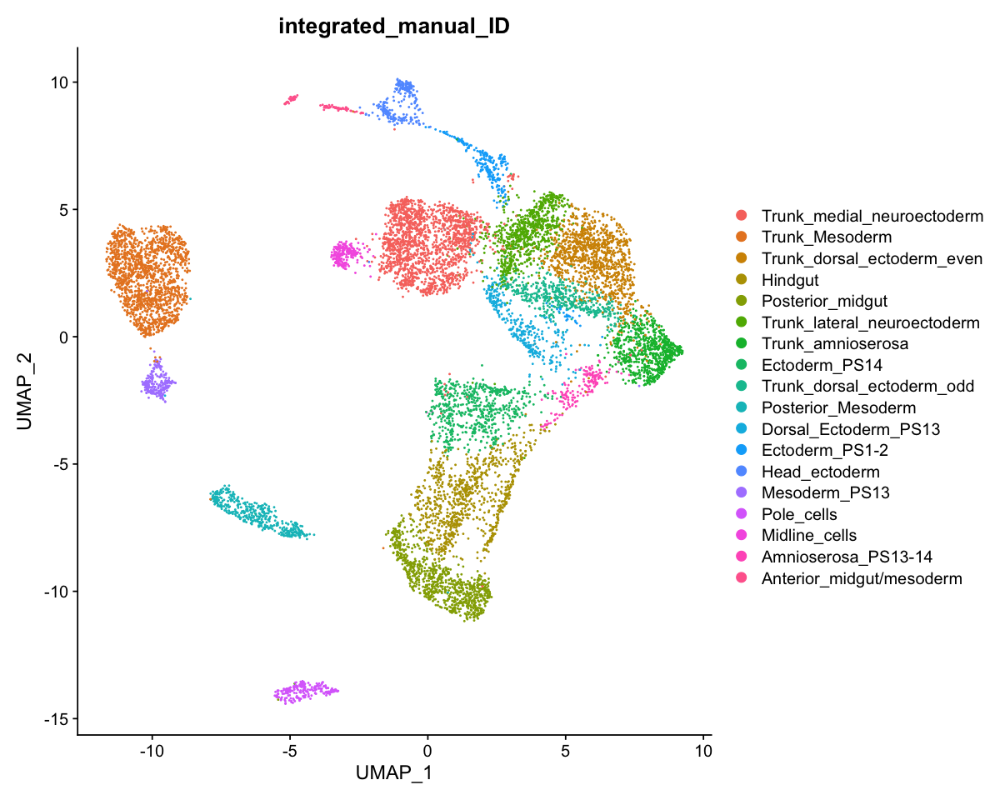

In [26]:
manual_id <- as.data.frame(seu.merge$seurat_clusters)
colnames(manual_id) <- c('manual_ID')
head(manual_id)
manual_id$manual_ID = dplyr::recode(manual_id$manual_ID, 
                                     "0"="Trunk_medial_neuroectoderm", #sog+, SoxN+
                                     "1"="Trunk_Mesoderm", #sna+, twi+, Antp+/-, Ubx+/-
                                     "2"="Trunk_dorsal_ectoderm_even", #dpp+, trn+
                                     "3"="Hindgut", #fkh+, byn+
                                     "4"="Posterior_midgut", #fkh+, ps+
                                     "5"="Trunk_lateral_neuroectoderm", #SoxN+, sog-
                                     "6"="Trunk_amnioserosa", #dap+
                                     "7"="Ectoderm_PS14", #Abd-B+, trn+, ftz+
                                     "8"="Trunk_dorsal_ectoderm_odd", #dpp+, trn-
                                     "9"="Posterior_Mesoderm", #sna+, twi+, Abd-B+
                                     "10"="Dorsal_Ectoderm_PS13", #dpp+, Abd-B+, ftz-
                                     "11"="Ectoderm_PS1-2", #Dfd+, Scr+
                                     "12"="Head_ectoderm", #oc+
                                     "13"="Mesoderm_PS13", #twi+, sna+, Abd-B+, trn-
                                     "14"="Pole_cells", #pgc+
                                     "15"="Midline_cells", #sim+
                                     "16"="Amnioserosa_PS13-14", #dap+, Abd-B+
                                     "17"="Anterior_midgut/mesoderm" #fkh+, sna+, twi+
                                   )
                                    

head(manual_id)
seu.merge$integrated_manual_ID <- manual_id
options(repr.plot.width=10, repr.plot.height=8)
DimPlot(seu.merge, reduction = 'umap', group.by = 'integrated_manual_ID')

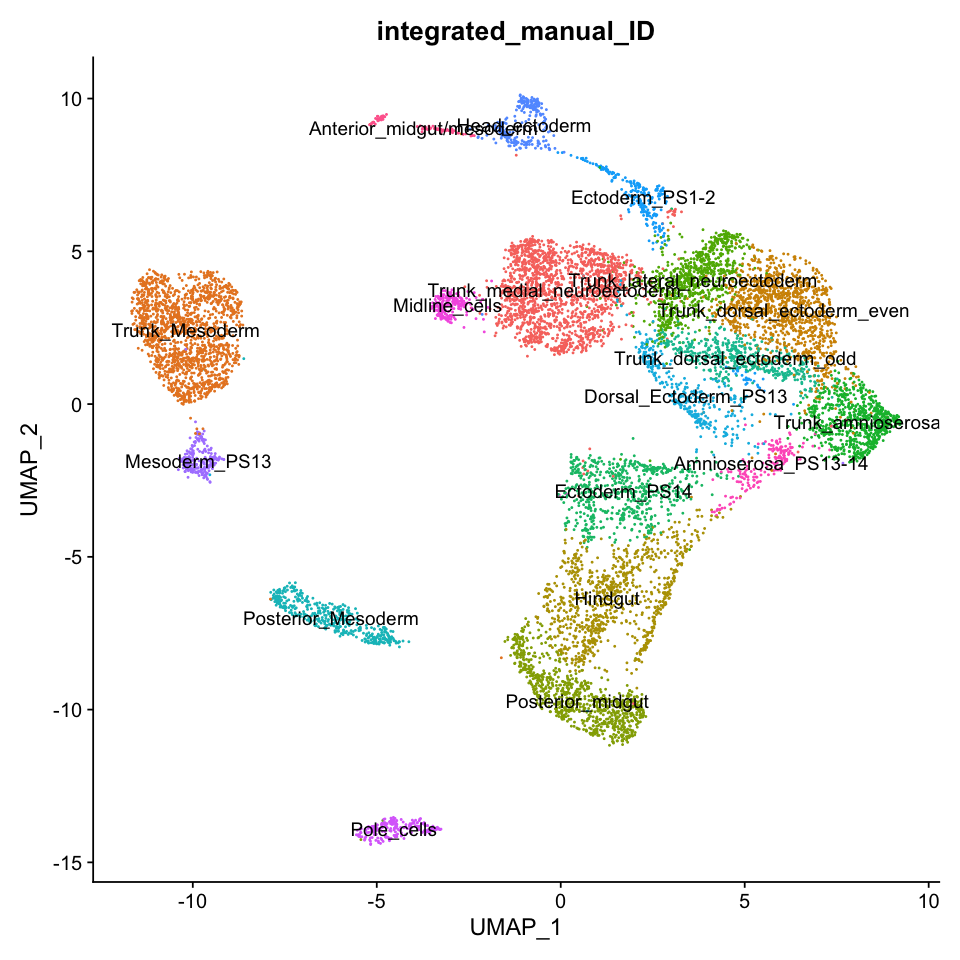

In [27]:
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.merge, reduction = 'umap', group.by = 'integrated_manual_ID', label =T) + NoLegend()

In [28]:
levels <- read.table(file="./seu_integrated_seurat_clusters_levels_color.txt", ,comment.char = "")
colors <- levels[,2]
levels <- levels[,1]
head(levels)
length(levels)
head(colors)
Idents(seu.merge) <- 'integrated_manual_ID'
levels(seu.merge) <- levels

[1] "Trunk_amnioserosa"           "Amnioserosa_PS13-14"        
[3] "Trunk_dorsal_ectoderm_odd"   "Trunk_dorsal_ectoderm_even" 
[5] "Trunk_lateral_neuroectoderm" "Trunk_medial_neuroectoderm"

[1] 18

[1] "burlywood2" "burlywood3" "olivedrab1" "olivedrab2" "olivedrab3"
[6] "olivedrab4"

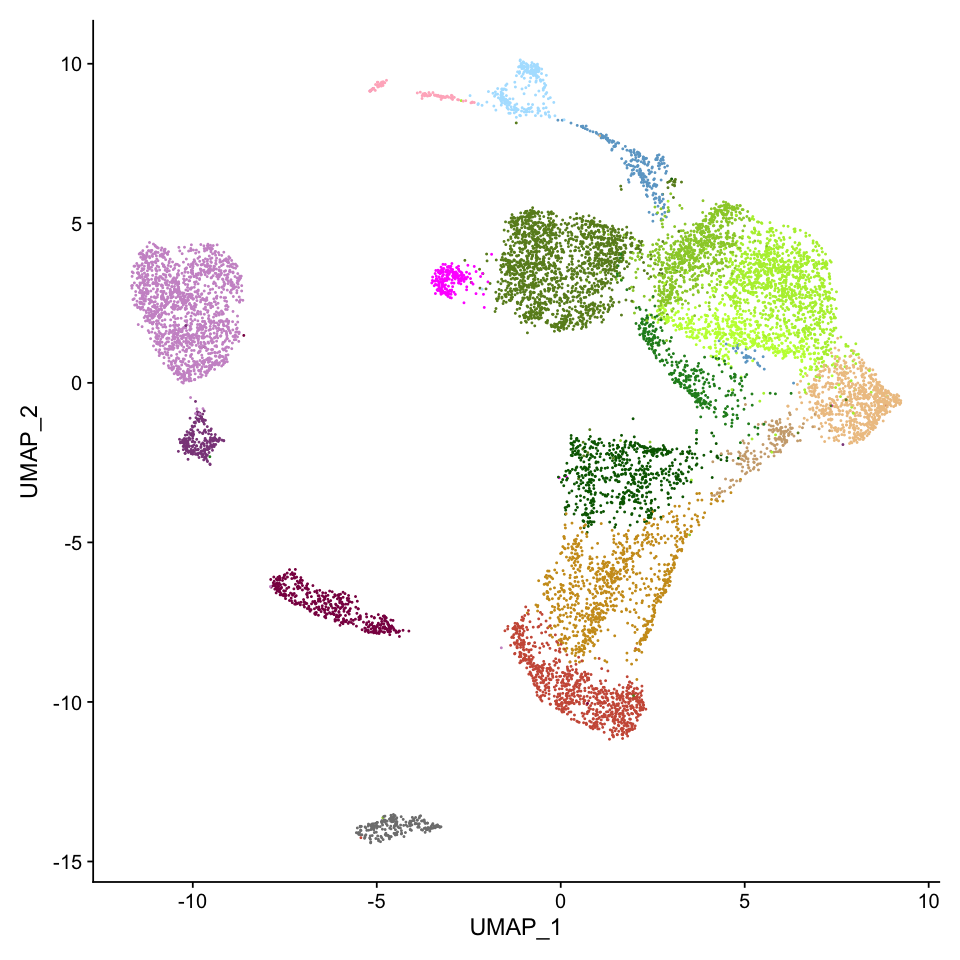

In [29]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.merge, reduction = 'umap', cols = colors) + NoLegend()
fig
ggsave(fig, file = "./figures/1_integrate_bcdRNAi_NaiveIngegration/all_cells_umap_bcdRNAi_integration.eps", dpi = 300, width =8, height =8)

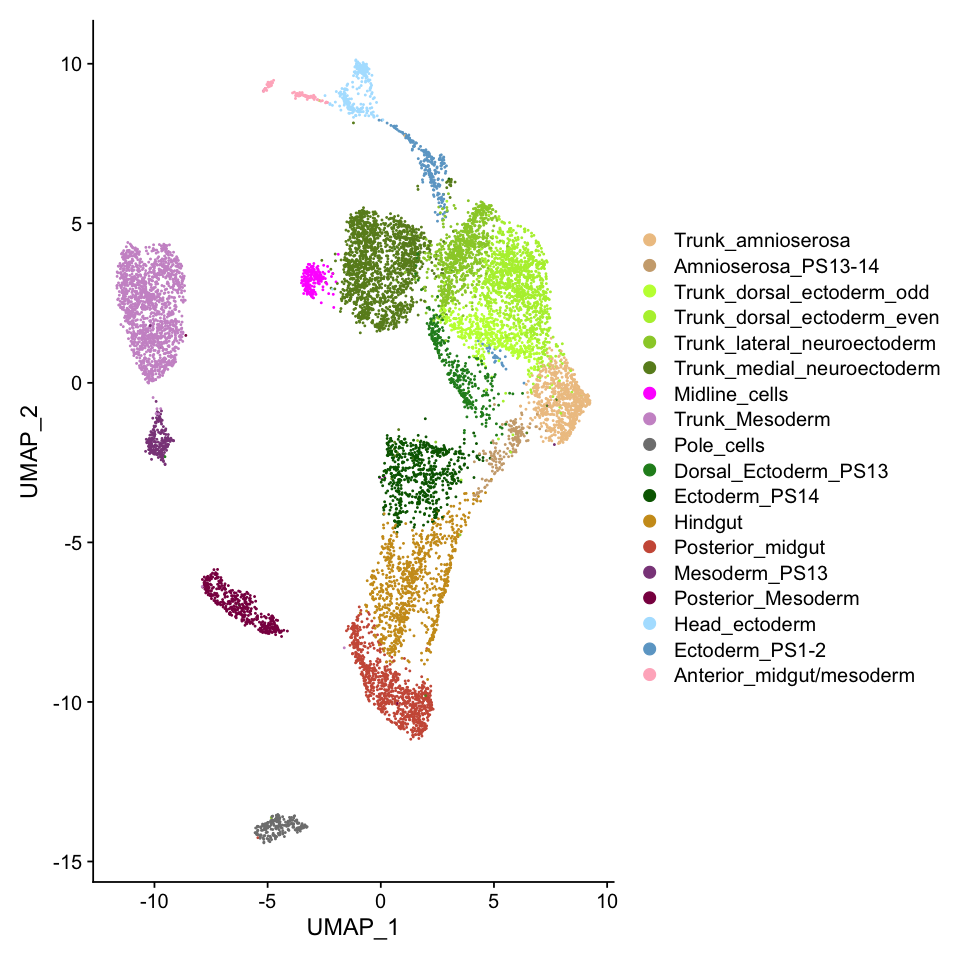

In [30]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.merge, reduction = 'umap', cols = colors)
fig
ggsave(fig, file = "./figures/1_integrate_bcdRNAi_NaiveIngegration/all_cells_umap2_bcdRNAi_integration.eps", dpi = 300, width = 12, height =8)

## Count number of cells from each dataset  in each cluster

In [31]:
count.ids <- as.matrix(table(seu.merge@meta.data$integrated_manual_ID,seu.merge@meta.data$genotype))

sorted.labels <- c('Trunk_amnioserosa','Trunk_dorsal_ectoderm_even','Trunk_dorsal_ectoderm_odd',
                  'Trunk_lateral_neuroectoderm','Trunk_medial_neuroectoderm','Midline_cells',
                  'Trunk_Mesoderm','Pole_cells',
                  'Amnioserosa_PS13-14','Ectoderm_PS14','Dorsal_Ectoderm_PS13','Hindgut','Posterior_midgut',
                  'Mesoderm_PS13','Posterior_Mesoderm',
                  'Head_ectoderm','Ectoderm_PS1-2','Anterior_midgut/mesoderm')

count.ids <- count.ids[sorted.labels,c('set_2','bcd_RNAi')]
count.ids
ratio.ids <- count.ids
ratio.ids[,'bcd_RNAi'] <- count.ids[,'bcd_RNAi']/dim(seu.bcd)[2]
ratio.ids[,'set_2'] <- count.ids[,'set_2']/dim(seu.set2)[2]
ratio.ids

                             
                              set_2 bcd_RNAi
  Trunk_amnioserosa             302      427
  Trunk_dorsal_ectoderm_even    538      568
  Trunk_dorsal_ectoderm_odd     273      225
  Trunk_lateral_neuroectoderm   376      444
  Trunk_medial_neuroectoderm    840      857
  Midline_cells                  98      116
  Trunk_Mesoderm                770      822
  Pole_cells                     83      133
  Amnioserosa_PS13-14            28      142
  Ectoderm_PS14                 186      453
  Dorsal_Ectoderm_PS13           96      245
  Hindgut                       265      624
  Posterior_midgut              227      629
  Mesoderm_PS13                  57      170
  Posterior_Mesoderm            111      313
  Head_ectoderm                 239        0
  Ectoderm_PS1-2                254        0
  Anterior_midgut/mesoderm      112        0

                             
                                   set_2   bcd_RNAi
  Trunk_amnioserosa           0.06220391 0.06922827
  Trunk_dorsal_ectoderm_even  0.11081359 0.09208820
  Trunk_dorsal_ectoderm_odd   0.05623069 0.03647860
  Trunk_lateral_neuroectoderm 0.07744593 0.07198444
  Trunk_medial_neuroectoderm  0.17301751 0.13894293
  Midline_cells               0.02018538 0.01880674
  Trunk_Mesoderm              0.15859938 0.13326848
  Pole_cells                  0.01709578 0.02156291
  Amnioserosa_PS13-14         0.00576725 0.02302205
  Ectoderm_PS14               0.03831102 0.07344358
  Dorsal_Ectoderm_PS13        0.01977343 0.03972114
  Hindgut                     0.05458290 0.10116732
  Posterior_midgut            0.04675592 0.10197795
  Mesoderm_PS13               0.01174047 0.02756161
  Posterior_Mesoderm          0.02286303 0.05074578
  Head_ectoderm               0.04922760 0.00000000
  Ectoderm_PS1-2              0.05231720 0.00000000
  Anterior_midgut/mesoderm    0.02

In [32]:
postscript("./figures/1_integrate_bcdRNAi_NaiveIngegration/seu_integrated_manual_ID_ratio_Naive_wo_set3.eps")
par(mar=c(5, 2, 2, 2))
par(oma = c(8, 2, 2, 2))
tbl <- with(seu.merge@meta.data, t(ratio.ids))
barplot(tbl, beside = TRUE, legend = T, las = 2, ylim = c(0, 0.20))
dev.off()

pdf 
  2

In [33]:
res <- list()
for (name in row.names(count.ids)){
    c.set2 <- count.ids[name,'set_2']
    c.bcd <- count.ids[name,'bcd_RNAi']
    mat <- c(c.set2,c.bcd,dim(seu.set2)[2]-c.set2,dim(seu.bcd)[2]-c.bcd)
    mat <- matrix(mat,nrow = 2)
    res <- c(res,list(fisher.test(mat)))
}
names(res) <- row.names(count.ids)

In [50]:
pval <- lapply(res, FUN = function(r){return(r$p.value)})
pval <- t(as.data.frame(pval))
colnames(pval) <- c('p-values')
pval
write.csv(pval, file = './p_values.csv')

,p-values
Trunk_amnioserosa,1.425946e-01
Trunk_dorsal_ectoderm_even,1.253923e-03
Trunk_dorsal_ectoderm_odd,8.990181e-07
Trunk_lateral_neuroectoderm,2.890767e-01
Trunk_medial_neuroectoderm,9.852640e-07
Midline_cells,6.267064e-01
Trunk_Mesoderm,1.840261e-04
Pole_cells,9.690987e-02
Amnioserosa_PS13.14,2.667950e-14
Ectoderm_PS14,1.512387e-15


In [35]:
saveRDS(seu.merge, file = '../../data/seurat_object/bcdRNAi_integration/seu_HQC_integrated_bcdRNAi.obj')

In [36]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-apple-darwin17.0 (64-bit)
Running under: macOS Catalina 10.15.7

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRblas.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRlapack.dylib

locale:
[1] ja_JP.UTF-8/ja_JP.UTF-8/ja_JP.UTF-8/C/ja_JP.UTF-8/ja_JP.UTF-8

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
[1] tibble_3.0.5      dplyr_1.0.3       Matrix_1.3-2      data.table_1.13.6
[5] magrittr_2.0.1    ggplot2_3.3.3     Seurat_3.2.3     

loaded via a namespace (and not attached):
  [1] nlme_3.1-151          matrixStats_0.57.0    RcppAnnoy_0.0.18     
  [4] RColorBrewer_1.1-2    httr_1.4.2            repr_1.1.0           
  [7] sctransform_0.3.2     tools_4.0.3           R6_2.5.1             
 [10] irlba_2.3.3           rpart_4.1-15          KernSmooth_2.23-18   
 [13] uwot_0.1.10           mgcv